## RTMPose from SportsPose

In [1]:
import numpy as np
import h5py
import imageio.v2 as imageio
from tqdm import tqdm
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import pickle
import os

import sys
sys.path.append('/home/lea/trampo/SportsPose/ConsistencyLoss/motionbertH36m')

from lib.utils.basis_transforms import transform_func, max_separated_xy_heatmap, rescale_pose, h36m_from_coco
import onnxruntime as ort
import torch
import cv2

# Load the model
onnx_path = "/home/lea/trampo/rtmpose/rtmpose-l_simcc-body7_pt-body7_420e-384x288-3f5a1437_20230504/end2end.onnx"
ort_session = ort.InferenceSession(onnx_path)
joint_names_h36m = ['hip','right_up_leg','right_leg','right_foot','left_up_leg','left_leg', 'left_foot','spine1','neck', 'head','head-top','left-arm','left_forearm','left_hand','right_arm','right_forearm','right_hand']
bones_h36m = [[0, 1], [1, 2], [2, 3], [0, 4], [4, 5], [5, 6], [0, 7], [7, 8], [8, 9], [9, 10], [8, 14], [14, 15], [15, 16], [8, 11], [11, 12], [12, 13]]
joints_coco2_h36m = [0, 12, 13, 14, 6, 7, 8, 1, 2, 3, 4, 5, 9, 10, 11]


def infer_2D_pose(images, ort_session):
    # joint indice description

    pose_input_size = (384, 288)
    frames = np.stack([transform_func(frame.astype(np.float32) / 255.0, pose_input_size) for frame in images])
    
    # Run the model
    ort_inputs = {ort_session.get_inputs()[0].name: frames}
    x_heatmaps, y_heatmaps = ort_session.run(None, ort_inputs)
    
    # Convert output from heatmap to joints
    if len(x_heatmaps.shape) == 4:
        # Max separated xy heatmaps expects the shape to be (B, J, W) and (B, J, H) or (J, W) and (J, H)
        x_heatmaps, y_heatmaps = x_heatmaps[:, 1, ...], y_heatmaps[:, 1, ...]
    joints, pose_conf = max_separated_xy_heatmap(x_heatmaps, y_heatmaps)

    print(f'Joints: {joints}')

    joints /= (x_heatmaps.shape[-1], y_heatmaps.shape[-1])

    print(x_heatmaps.shape[-1], y_heatmaps.shape[-1])
    print(f'Joints: {joints}')
    
    joints = rescale_pose(joints, np.array([0, 0, 256, 256]), np.array(pose_input_size))  # Convert to original video resolution
    print(f'Joints: {joints}')
    
    # Convert from COCO to H36M
    joints = np.array(h36m_from_coco(torch.tensor(joints)))
    return frames, joints, pose_conf

ModuleNotFoundError: No module named 'h5py'

In [ ]:
seq = '/mnt/D494C4CF94C4B4F0/Trampoline_avril2025/Images_trampo_avril2025/20250429/1_partie_0429_000-Camera4_M11458'

""" 
images = []

for file in os.listdir(seq)[:5]:
    im = cv2.imread(os.path.join(seq, file))
    images.append(im)

 # Now stack and load the images for each camera
image_path = []
for i in range(len(cam_ids)):
    image_path.append(['./{}/seq_{:03d}/cam_{:02d}/image_{:06d}.png'.format(mode, seq, int(cam_ids[i]), int(frame)) for frame in frames[i]])
"""

""" images = [imageio.imread(os.path.join(seq, image_name)) for image_name in os.listdir(seq)[100:120]]

pose_input_size = (384, 288)
frames = np.stack([
    transform_func(frame.transpose(2, 0, 1).astype(np.float32) / 255.0, pose_input_size)
    for frame in images
])

frames = np.stack([frame.transpose(2, 0, 1) for frame in images]) """

images = []
cam_names = ['Camera1_M11139', 'Camera2_M11140', 'Camera3_M11141', 'Camera4_M11458',
             'Camera5_M11459', 'Camera6_M11461', 'Camera7_M11462', 'Camera8_M11463']

im_path = '/mnt/D494C4CF94C4B4F0/Trampoline_avril2025/Images_trampo_avril2025/20250429'

sequences = set([str(name).split('-')[0] for name in os.listdir(im_path)])
sequences = sorted(list(sequences))

for cam in cam_names:
    seq = sequences[0]
    frames = sorted(list(os.listdir(os.path.join(im_path, seq+'-'+cam))))[11:12]
    images_cam = [imageio.imread(os.path.join(im_path, seq+'-'+cam, f)) for f in frames]
    images.append(images_cam)
    break

images_t = [np.stack(image_cam).transpose(0, 3, 1, 2) for image_cam in images]  # (C, S, 3, H, W)

print('Start inference')
results = [infer_2D_pose(frames, ort_session) for frames in images_t]
frames, joints, pose_conf = zip(*results)

### Find mapping between cropped and original image

In [ ]:
def inverse_transform_keypoints(keypoints, orig_size, target_size):
    orig_h, orig_w = orig_size
    target_h, target_w = target_size

    # Step 1: compute resized size
    h, w = orig_h, orig_w
    short, long = (w, h) if w <= h else (h, w)
    new_short = round(min(target_h, target_w) * short / long)
    if h >= w:
        resized_h, resized_w = min(target_h, target_w), new_short
    else:
        resized_h, resized_w = new_short, min(target_h, target_w)

    # Step 2: compute padding applied
    pad_y = (target_h - resized_h) // 2 if target_h > resized_h else 0
    pad_x = (target_w - resized_w) // 2 if target_w > resized_w else 0

    print(pad_x, pad_y)

    # Step 3: remove padding
    keypoints_unpad = keypoints.copy().astype(np.float32)
    """ keypoints_unpad[:, 0] -= pad_x
    keypoints_unpad[:, 1] -= pad_y """

    # Step 4: rescale to original image
    scale_x = orig_w / resized_w
    scale_y = orig_h / resized_h

    keypoints_orig = np.empty_like(keypoints_unpad)
    keypoints_orig[:, 0] = keypoints_unpad[:, 0] * scale_x
    keypoints_orig[:, 1] = keypoints_unpad[:, 1] * scale_y

    return keypoints_orig, scale_x, scale_y

def map_keypoints_to_original(keypoints, orig_size, target_size):
    orig_h, orig_w = orig_size
    target_h, target_w = target_size

    # Step 1: compute resized size
    h, w = orig_h, orig_w
    short, long = (w, h) if w <= h else (h, w)
    new_short = round(min(target_h, target_w) * short / long)
    if h >= w:
        resized_h, resized_w = min(target_h, target_w), new_short
    else:
        resized_h, resized_w = new_short, min(target_h, target_w)

    scale_x = orig_w / resized_w
    scale_y = orig_h / resized_h

    pad_x = max(0, (target_w - (target_h/orig_w * orig_h)) // 2)
    pad_y = max(0, (target_h - (target_w/orig_h * orig_w)) // 2)

    mapped = (keypoints - (pad_x, pad_y)) * (scale_x, scale_y)

    return mapped

In [ ]:
orig_size = (1920, 1080)
target_size = (384, 288)

# Keypoints in transformed space (after model prediction)
pred_keypoints = np.array([[50, 150], [100, 200], [250, 130], [120, 120]])

plt.figure()
plt.imshow(frames[0][0].transpose(1, 2, 0))
plt.scatter(*pred_keypoints.T)
plt.show()

mapped = map_keypoints_to_original(pred_keypoints, orig_size, target_size)

plt.figure()
plt.imshow(images_t[0][0].transpose(1, 2, 0))
plt.scatter(*mapped.T)
plt.show()

### Show keypoints

In [ ]:
cam = 0
f = 0

im = images[cam][f]
print(im.shape)

print(joints[cam][f])

plt.figure()
plt.imshow(frames[cam][f].transpose(1, 2, 0))
plt.scatter(*joints[cam][f].T, s=4)
plt.show()

mapped = map_keypoints_to_original(joints[cam][f], (1920, 1080), (384, 288))

#plt.figure(figsize=(10, 9))
plt.imshow(im)
plt.scatter(*mapped.T, s=4)
plt.scatter(*joints[cam][f].T, s=4)
plt.axis('off')
plt.show()

## RTMPose from MMPose (copy of ViT pipeline)

In [ ]:
import logging
import mimetypes
import os
import time
from argparse import ArgumentParser
from tqdm.notebook import tqdm

import cv2
import pickle
import json_tricks as json
import mmcv
import mmengine
import numpy as np
from mmengine.logging import print_log

from mmpose.apis import inference_topdown
from mmpose.apis import init_model as init_pose_estimator
from mmpose.evaluation.functional import nms
from mmpose.registry import VISUALIZERS
from mmpose.structures import merge_data_samples, split_instances
from mmpose.utils import adapt_mmdet_pipeline

try:
    from mmdet.apis import inference_detector, init_detector
    has_mmdet = True
except (ImportError, ModuleNotFoundError):
    has_mmdet = False

## Model config

In [ ]:
det_config = '/home/lea/trampo/mmpose/demo/mmdetection_cfg/rtmdet_m_640-8xb32_coco-person.py'
det_checkpoint = 'https://download.openmmlab.com/mmpose/v1/projects/rtmpose/rtmdet_m_8xb32-100e_coco-obj365-person-235e8209.pth'
pose_config = '/home/lea/trampo/mmpose/configs/body_2d_keypoint/rtmpose/body8/rtmpose-m_8xb256-420e_body8-256x192.py'
pose_checkpoint = 'https://download.openmmlab.com/mmpose/v1/projects/rtmposev1/rtmpose-m_simcc-body7_pt-body7_420e-256x192-e48f03d0_20230504.pth'

device = 'cuda:0'

det_cat_id = 0
bbox_thr = 0.3
nms_thr = 0.3
kpt_thr = 0.3
radius = 4
thickness = 1

# Init detector
det_model= init_detector(det_config, det_checkpoint, device=device)
det_model.cfg = adapt_mmdet_pipeline(det_model.cfg)

# Init pose model
pose_model = init_pose_estimator(pose_config, pose_checkpoint, device=device)


In [ ]:
def save_to_openpose(json_file_path, keypoints, scores):
    '''
    Save the keypoints and scores to a JSON file in the OpenPose format

    INPUTS:
    - json_file_path: Path to save the JSON file
    - keypoints: Detected keypoints
    - scores: Confidence scores for each keypoint

    OUTPUTS:
    - JSON file with the detected keypoints and confidence scores in the OpenPose format
    '''

    # Prepare keypoints with confidence scores for JSON output
    nb_detections = len(keypoints)
    # print('results: ', keypoints, scores)
    detections = []
    for i in range(nb_detections): # nb of detected people
        keypoints_with_confidence_i = []
        for kp, score in zip(keypoints[i], scores[i]):
            keypoints_with_confidence_i.extend([kp[0].item(), kp[1].item(), score.item()])
        detections.append({
                    "person_id": [-1],
                    "pose_keypoints_2d": keypoints_with_confidence_i,
                    "face_keypoints_2d": [],
                    "hand_left_keypoints_2d": [],
                    "hand_right_keypoints_2d": [],
                    "pose_keypoints_3d": [],
                    "face_keypoints_3d": [],
                    "hand_left_keypoints_3d": [],
                    "hand_right_keypoints_3d": []
                })
            
    # Create JSON output structure
    json_output = {"version": 1.3, "people": detections}
    
    # Save JSON output for each frame
    json_output_dir = os.path.abspath(os.path.join(json_file_path, '..'))
    if not os.path.isdir(json_output_dir): os.makedirs(json_output_dir)
    with open(json_file_path, 'w') as json_file:
        json.dump(json_output, json_file)


def process_images(detector, pose_estimator, img_name, frame_names,
                      out_img_root, keypoint_pkl_path, pose_dir,
                      show_interval=0, bbox_thr = 0.3, nms_thr = 0.3, kpt_thr = 0.3):
    
    drawn_frames = []
    all_keypoints = {}  # frame_name → list of person dicts
    frame_paths = [os.path.join(img_name, frame_name) for frame_name in frame_names]

    for frame_idx, image_file in tqdm(enumerate(frame_paths)):
        out_file = os.path.join(out_img_root, f'vis_{frame_names[frame_idx]}')

        # predict bbox
        det_result = inference_detector(detector, image_file)
        pred_instance = det_result.pred_instances.cpu().numpy()
        bboxes = np.concatenate(
            (pred_instance.bboxes, pred_instance.scores[:, None]), axis=1)
        bboxes = bboxes[np.logical_and(pred_instance.labels == 0,
                                    pred_instance.scores > bbox_thr)]
        bboxes = bboxes[nms(bboxes, nms_thr), :4]

        # predict keypoints
        pose_results = inference_topdown(pose_estimator, image_file, bboxes)
        data_samples = merge_data_samples(pose_results)

        pose_results = data_samples.get('pred_instances', None)

        keypoints = [r['keypoints'] for r in pose_results]
        scores = [r['keypoint_scores'] for r in pose_results]

        keypoints = np.array(keypoints).squeeze()
        if keypoints.ndim == 2:
            keypoints = np.expand_dims(keypoints, axis=0)

        scores = np.array(scores).squeeze()
        if scores.ndim == 1:
            scores = np.expand_dims(scores, axis=0)

        json_output_dir = os.path.join(pose_dir, f'{os.path.basename(img_name)}_json')
        json_file_path = os.path.join(json_output_dir, f"{os.path.splitext(os.path.basename(image_file))[0]}_{frame_idx:06d}.json")
        
        save_to_openpose(json_file_path, keypoints, scores)

        # Collect keypoints with person ID
        keypoints_per_frame = []
        for pid, result in enumerate(pose_results):
            keypoints_per_frame.append({
                "id": pid,
                "bbox": result['bboxes'],  # [x1, y1, x2, y2]
                "keypoints": result['keypoints'].tolist()
            })

        all_keypoints[frame_names[frame_idx]] = keypoints_per_frame

        """ visualizer = VISUALIZERS.build(pose_model.cfg.visualizer)
        visualizer.set_dataset_meta(pose_model.dataset_meta)

        # 3. Visualiser sur l'image
        image = cv2.imread(image_file, cv2.COLOR_RGB2BGR)
        visualizer.add_datasample(
            'result',
            image,                 # chemin ou image déjà chargée
            pose_results,
            draw_gt=False,
            draw_heatmap=False,
            kpt_thr=kpt_thr,
            show=False,
            wait_time=0,
            out_file=out_file           # équivalent de out_file dans vis_pose_result
        ) """

    with open(keypoint_pkl_path, 'wb') as f:
        pickle.dump(all_keypoints, f)

    return

In [ ]:
path_root = "/mnt/D494C4CF94C4B4F0/Trampoline_avril2025/Images_trampo_avril2025/20250429"
out_root = path_root + "_rtm"
keypoint_path = path_root+ "_rtm-keypts"
pose_dir = path_root + "_rtm-pose"

os.makedirs(out_root, exist_ok=True)
os.makedirs(keypoint_path, exist_ok=True)
os.makedirs(pose_dir, exist_ok=True)

files = os.listdir(path_root)
sorted_files = sorted(files)

for i in tqdm(sorted_files):
    print(i)
    if i + '_vis' not in os.listdir(out_root):
        img_name = os.path.join(path_root, i)
        out_img_root = os.path.join(out_root, i + '_vis')
        frame_names = os.listdir(img_name)
        frame_names.sort(key=lambda x: int(x.split('.')[0].split('_')[1]))
        
        process_images(det_model, pose_model, img_name, frame_names, out_img_root, keypoint_path+'/'+i+'.pkl', pose_dir)
        #convert_to_video(drawn_frames, out_img_root, img_name)

In [ ]:
!python demo/topdown_demo_with_mmdet.py \
    demo/mmdetection_cfg/rtmdet_m_640-8xb32_coco-person.py \
    https://download.openmmlab.com/mmpose/v1/projects/rtmpose/rtmdet_m_8xb32-100e_coco-obj365-person-235e8209.pth \
    configs/body_2d_keypoint/rtmpose/body8/rtmpose-m_8xb256-420e_body8-256x192.py \
    https://download.openmmlab.com/mmpose/v1/projects/rtmposev1/rtmpose-m_simcc-body7_pt-body7_420e-256x192-e48f03d0_20230504.pth \
    --input /mnt/D494C4CF94C4B4F0/Trampoline_avril2025/Images_trampo_avril2025/20250429/1_partie_0429-Camera3_M11141/frame_00115.png --show --draw-heatmap \
    --output-root vis_results/

In [ ]:
import os
import sys
import tempfile
import warnings
import cv2
import pickle
import json
from argparse import ArgumentParser

from mmpose.apis import (inference_top_down_pose_model, init_pose_model,
                         process_mmdet_results, vis_pose_result)
from mmpose.datasets import DatasetInfo

try:
    from mmdet.apis.inference import inference_detector, init_detector
    has_mmdet = True
except (ImportError, ModuleNotFoundError):
    has_mmdet = False
    print('Import error')

from tqdm.notebook import tqdm


## Model config

In [ ]:
from mmpose.apis import MMPoseInferencer

# Choose RTMPose model alias or config
inferencer = MMPoseInferencer(
    pose2d= "RTMPose/rtmpose-l_8xb256-420e_coco-256x192.py" ,  # or 'rtmpose_s', 'rtmpose_t', etc
    pose2d_weights= "RTMPose/rtmpose-l_simcc-aic-coco_pt-aic-coco_420e-256x192-f016ffe0_20230126.pth",  # if you want a specific checkpoint
    det_model= "RTMPose/rtmdet_nano_320-8xb32_coco-person.py",  # e.g. detection model alias
    det_weights= "RTMPose/rtmdet_nano_8xb32-100e_coco-obj365-person-05d8511e.pth"
)

In [ ]:
det_config = "RTMPose/rtmdet_nano_320-8xb32_coco-person.py" 
det_checkpoint = "RTMPose/rtmdet_nano_8xb32-100e_coco-obj365-person-05d8511e.pth"

pose_config = "RTMPose/rtmpose-l_8xb256-420e_coco-256x192.py"  
pose_checkpoint = "RTMPose/rtmpose-l_simcc-aic-coco_pt-aic-coco_420e-256x192-f016ffe0_20230126.pth"

device = "cuda:0"

det_cat_id = 1 # Category id for bounding box detection model
bbox_thr = 0.5 # Bounding box score threshold
kpt_thr = 0.5 # Keypoint score threshold
radius = 4 # Keypoint radius for visualization
thickness = 1 # Link thickness for visualization

""" det_model = init_detector(det_config, det_checkpoint, device=device.lower())

# build the pose model from a config file and a checkpoint file
pose_model = init_pose_model(pose_config, pose_checkpoint, device=device.lower())

dataset = pose_model.cfg.data['test']['type']
dataset_info = pose_model.cfg.data['test'].get('dataset_info', None)
if dataset_info is None:
    warnings.warn(
        'Please set `dataset_info` in the config.'
        'Check https://github.com/open-mmlab/mmpose/pull/663 for details.',
        DeprecationWarning)
else:
    dataset_info = DatasetInfo(dataset_info)
 """

# Init detector
det_model = init_detector(det_config, det_checkpoint, device=device.lower())

# Init pose model
pose_model = init_pose_model(pose_config, pose_checkpoint, device=device.lower())

# === Dataset meta (MMPose >= 1.0) ===
if hasattr(pose_model, "dataset_meta") and pose_model.dataset_meta is not None:
    dataset_info = DatasetInfo(pose_model.dataset_meta)
else:
    dataset_info = None


## Run model on frames

In [ ]:
def save_to_openpose(json_file_path, keypoints, scores):
    '''
    Save the keypoints and scores to a JSON file in the OpenPose format

    INPUTS:
    - json_file_path: Path to save the JSON file
    - keypoints: Detected keypoints
    - scores: Confidence scores for each keypoint

    OUTPUTS:
    - JSON file with the detected keypoints and confidence scores in the OpenPose format
    '''

    # Prepare keypoints with confidence scores for JSON output
    nb_detections = len(keypoints)
    # print('results: ', keypoints, scores)
    detections = []
    for i in range(nb_detections): # nb of detected people
        keypoints_with_confidence_i = []
        for kp, score in zip(keypoints[i], scores[i]):
            keypoints_with_confidence_i.extend([kp[0].item(), kp[1].item(), score.item()])
        detections.append({
                    "person_id": [-1],
                    "pose_keypoints_2d": keypoints_with_confidence_i,
                    "face_keypoints_2d": [],
                    "hand_left_keypoints_2d": [],
                    "hand_right_keypoints_2d": [],
                    "pose_keypoints_3d": [],
                    "face_keypoints_3d": [],
                    "hand_left_keypoints_3d": [],
                    "hand_right_keypoints_3d": []
                })
            
    # Create JSON output structure
    json_output = {"version": 1.3, "people": detections}
    
    # Save JSON output for each frame
    json_output_dir = os.path.abspath(os.path.join(json_file_path, '..'))
    if not os.path.isdir(json_output_dir): os.makedirs(json_output_dir)
    with open(json_file_path, 'w') as json_file:
        json.dump(json_output, json_file)


def run_rotate(det_model, img_name, frame_names, out_img_root, keypoint_pkl_path, pose_dir):
    drawn_frames = []
    all_keypoints = {}  # frame_name → list of person dicts
    frame_paths = [os.path.join(img_name, frame_name) for frame_name in frame_names]

    for frame_idx, image_file in tqdm(enumerate(frame_paths)):
        out_file = os.path.join(out_img_root, f'vis_{frame_names[frame_idx]}')

        # rotate to portrait
        """ img = cv2.imread(image_file)
        rotated_img = cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)

        tmp_fd, tmp_img_path = tempfile.mkstemp(suffix=".png")
        os.close(tmp_fd)
        cv2.imwrite(tmp_img_path, rotated_img) """

        mmdet_results = inference_detector(det_model, image_file)
        person_results = process_mmdet_results(mmdet_results, det_cat_id)

        for person in person_results:
            person['bbox'][2] = max(person['bbox'][2], 1)  # éviter w=0
            person['bbox'][3] = max(person['bbox'][3], 1)  # éviter h=0
            person['dataset_idx'] = 0  # <-- hack pour ViTPose++

        pose_results, returned_outputs = inference_top_down_pose_model(
            pose_model,
            image_file,
            person_results,
            bbox_thr=bbox_thr,
            format='xyxy',
            dataset=dataset,
            dataset_info=dataset_info,
            return_heatmap=False,
            outputs=None)

        keypoints = [r['keypoints'][:, :2] for r in pose_results]
        scores = [r['keypoints'][:, 2] for r in pose_results]

        json_output_dir = os.path.join(pose_dir, f'{os.path.basename(img_name)}_json')
        json_file_path = os.path.join(json_output_dir, f"{os.path.splitext(os.path.basename(image_file))[0]}_{frame_idx:06d}.json")
        
        save_to_openpose(json_file_path, keypoints, scores)

        # Collect keypoints with person ID
        keypoints_per_frame = []
        for pid, result in enumerate(pose_results):
            keypoints_per_frame.append({
                "id": pid,
                "bbox": result['bbox'],  # [x1, y1, x2, y2]
                "keypoints": result['keypoints'].tolist()
            })

        all_keypoints[frame_names[frame_idx]] = keypoints_per_frame

        vis_pose_result(
            pose_model,
            image_file,
            pose_results,
            dataset=dataset,
            dataset_info=dataset_info,
            kpt_score_thr=kpt_thr,
            radius=radius,
            thickness=thickness,
            show=False,
            out_file=out_file)

        drawn_frame = cv2.imread(out_file)
        drawn_frames.append(drawn_frame)

        #os.remove(tmp_img_path)

    # Save all keypoints as .pkl
    with open(keypoint_pkl_path, 'wb') as f:
        pickle.dump(all_keypoints, f)

    return drawn_frames


## Convert results to video

In [ ]:
def convert_to_video(drawn_frames, out_img_root, img_name):
    output_video_path = os.path.join(out_img_root, img_name.split('/')[-1].split('.')[0] + '_vit.mp4')
    height, width, _ = drawn_frames[0].shape

    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    video_writer = cv2.VideoWriter(output_video_path, fourcc, fps=120.0, frameSize=(width, height))

    for frame in drawn_frames:
        video_writer.write(frame)

    video_writer.release()

def convert_imfolder_to_video(images_path, video_path):
    frame0 = cv2.imread(os.path.join(images_path, os.listdir(images_path)[0]))
    height, width, _ = frame0.shape

    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    video_writer = cv2.VideoWriter(video_path, fourcc, fps=120.0, frameSize=(width, height))

    image_names = sorted(os.listdir(images_path), key=lambda x: int(str(x).split('.')[0][-5:]))

    for file in image_names:
        frame = cv2.imread(os.path.join(images_path, file))
        frame = cv2.resize(frame, (width, height))
        video_writer.write(frame)

    video_writer.release()

In [ ]:
path_im = '/mnt/D494C4CF94C4B4F0/Trampoline_avril2025/Images_trampo_avril2025/20250429_vitL'
video_path_root = '/mnt/D494C4CF94C4B4F0/Trampoline_avril2025/Results_video/20250429_vitL'
if not os.path.isdir(video_path_root):
    os.makedirs(video_path_root)

for seq in tqdm(sorted(os.listdir(path_im))):
    video_path = os.path.join(video_path_root, seq)
    if not os.path.isfile(video_path+'.mp4'):
        convert_imfolder_to_video(os.path.join(path_im, seq), video_path+'.mp4')

## Data config

In [ ]:
path_root = "/mnt/D494C4CF94C4B4F0/Trampoline_avril2025/Images_trampo_avril2025/20250429"
out_root = path_root + "_rtm"
keypoint_path = path_root+ "_keypts"
pose_dir = path_root + "_rtmpose"

os.makedirs(out_root, exist_ok=True)
#os.makedirs(keypoint_path, exist_ok=True)
os.makedirs(pose_dir, exist_ok=True)

files = os.listdir(path_root)
sorted_files = sorted(files)

for i in tqdm(sorted_files):
    print(i)
    if i + '_vis' not in os.listdir(out_root):
        img_name = os.path.join(path_root, i)
        out_img_root = os.path.join(out_root, i + '_vis')
        frame_names = os.listdir(img_name)
        frame_names.sort(key=lambda x: int(x.split('.')[0].split('_')[1]))
        
        drawn_frames = run_rotate(det_model, img_name, frame_names, out_img_root, keypoint_path+'/'+i+'.pkl', pose_dir)
        #convert_to_video(drawn_frames, out_img_root, img_name)

In [ ]:
import shutil

dist_path = '/home/lea/trampo/Pose2Sim/pose_all_vit++'
src_path = '/mnt/D494C4CF94C4B4F0/Trampoline_avril2025/Images_trampo_avril2025/20250429_vit++B'

os.makedirs(dist_path, exist_ok=True)

for seq in os.listdir(src_path):
    if os.path.isdir(os.path.join(src_path, seq)):
        os.mkdir(os.path.join(dist_path, seq))
        for file in os.listdir(os.path.join(src_path, seq, 'json')):
            shutil.copy2(os.path.join(src_path, seq, 'json', file), os.path.join(dist_path, seq, file))

## Visualize results

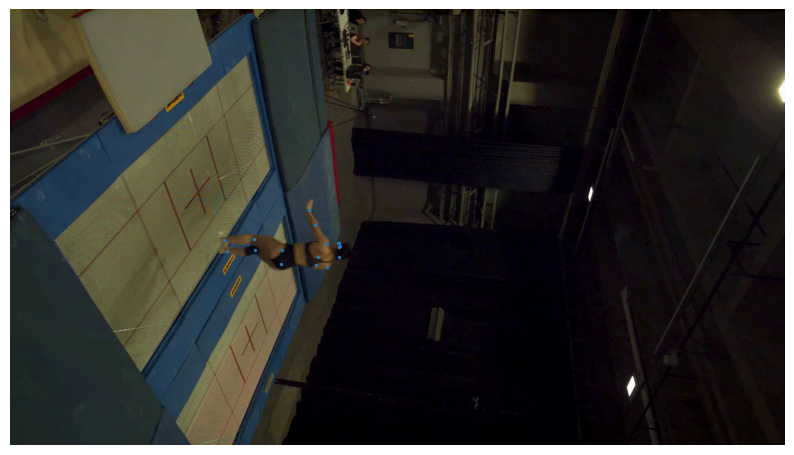

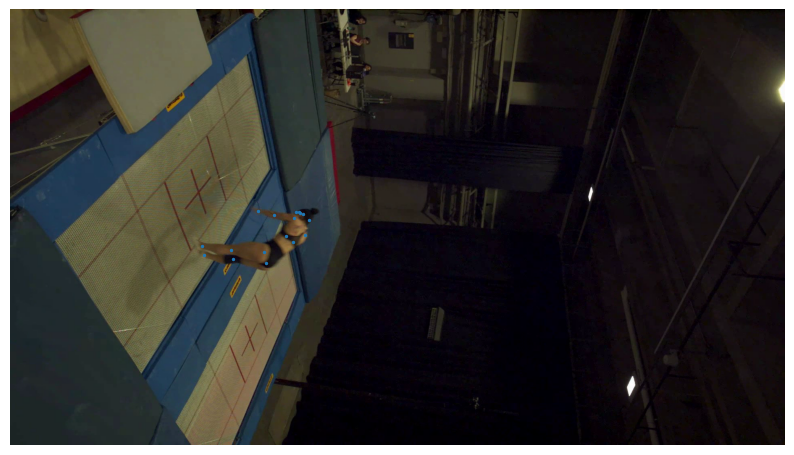

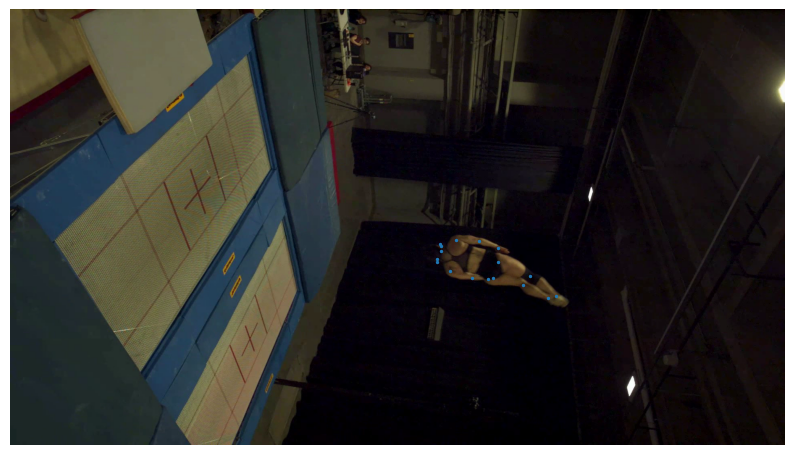

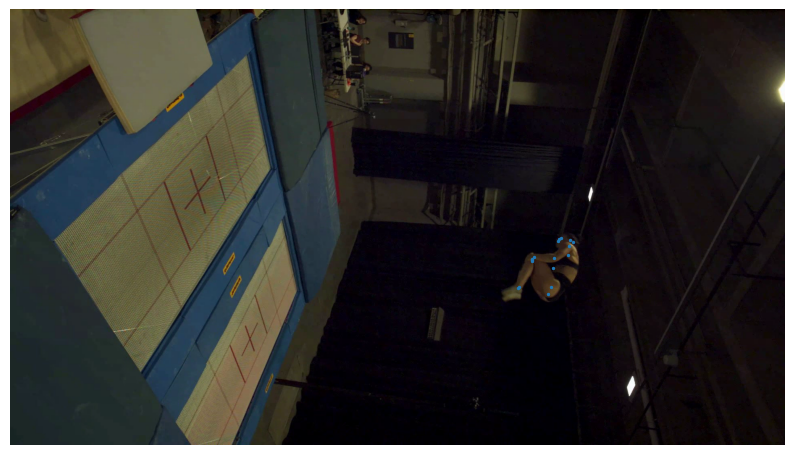

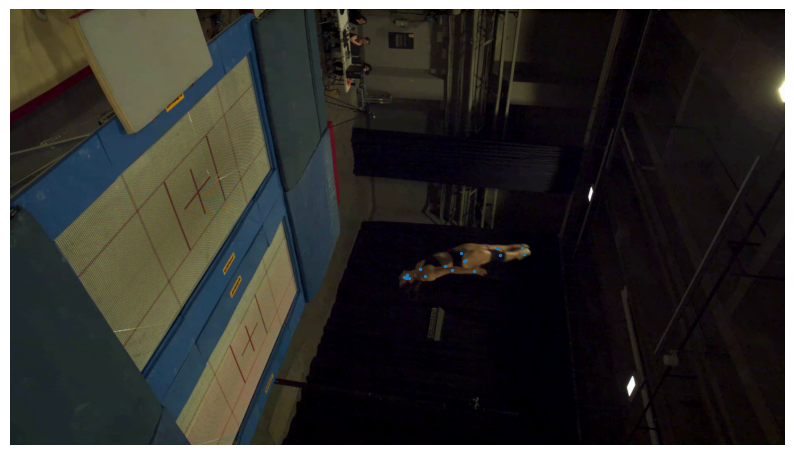

...

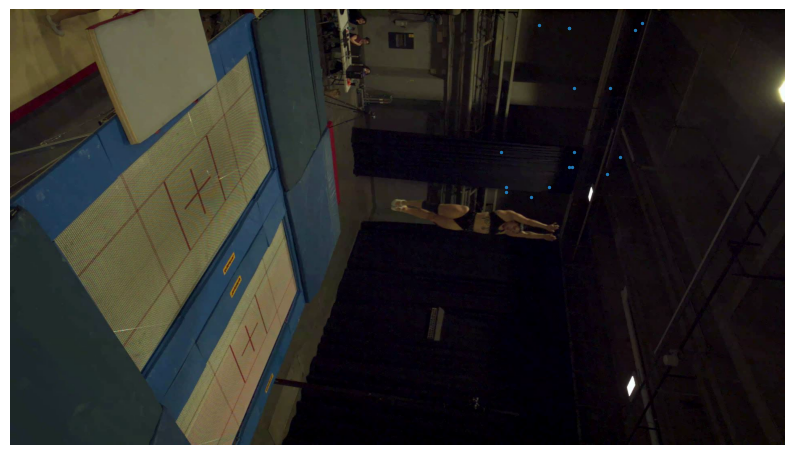

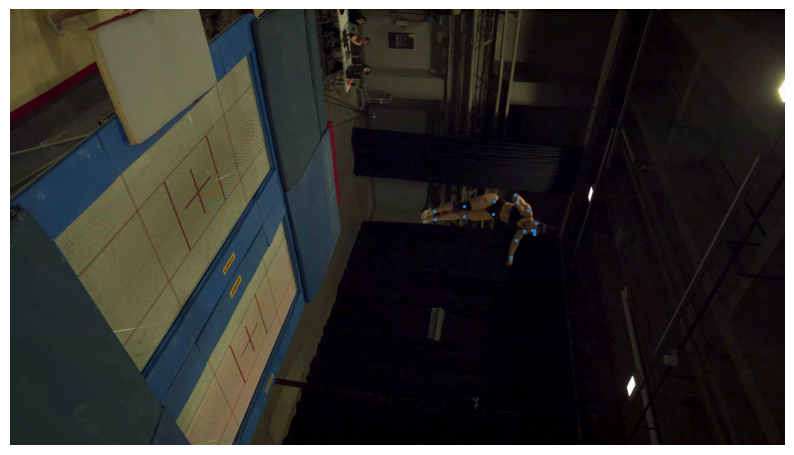

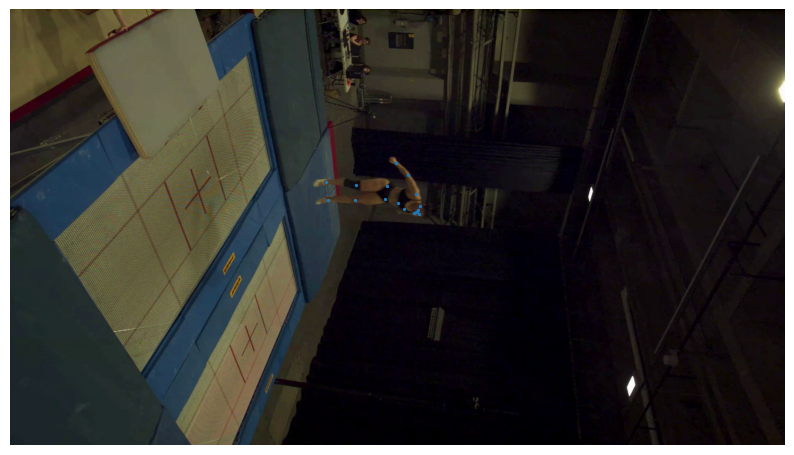

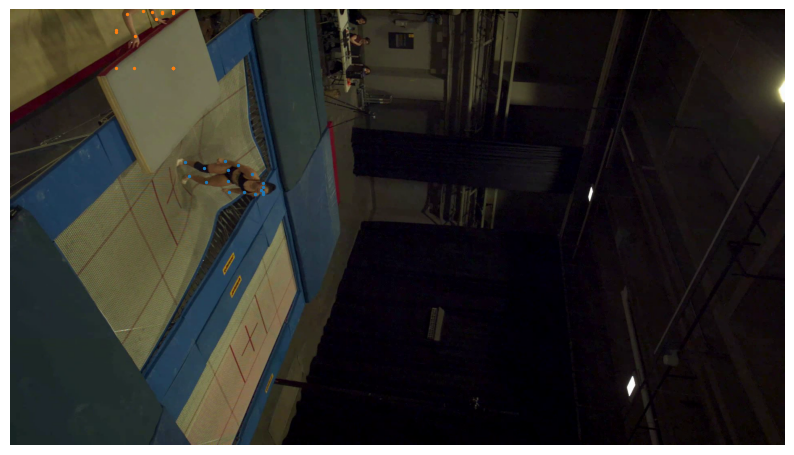

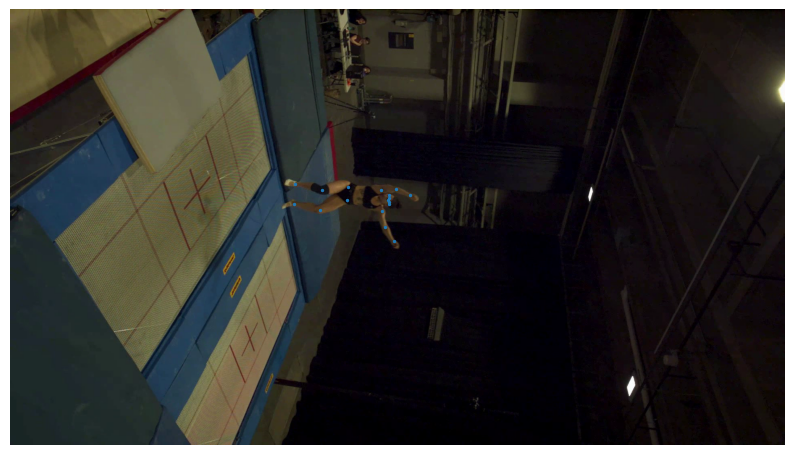

In [28]:
import os
import cv2
import numpy as np
import json
import matplotlib.pyplot as plt

im_path = '/mnt/D494C4CF94C4B4F0/Trampoline_avril2025/Images_trampo_avril2025/20250429'
pose_path = '/mnt/D494C4CF94C4B4F0/Trampoline_avril2025/Images_trampo_avril2025/20250429_rtm-pose'

for seq in sorted(os.listdir(im_path)):
    im_dir = os.path.join(im_path, seq)
    pose_dir = os.path.join(pose_path, seq+'_json')
    if os.path.isdir(im_dir) and os.path.isdir(os.path.join(im_path, seq)):
        for frame in os.listdir(os.path.join(im_path, seq)):

            frame_nb = int(str(frame)[6:11])
            if frame_nb % 50 == 0:

                img = cv2.imread(os.path.join(im_dir, frame))
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

                json_file = os.path.join(pose_dir, str(frame.split('.')[0]) + f'_{frame_nb:06d}' + '.json')
                try:
                    with open(json_file, 'r') as f:
                        json_output = json.load(f)
                except:
                    continue
                
                keypoints = json_output['people']

                plt.figure(figsize=(10,6))
                plt.imshow(img)

                for d in keypoints:
                    pts = d['pose_keypoints_2d']
                    pts = np.array(pts).reshape(-1, 3)[:, 0:2]
                    plt.scatter(*pts.T, s=2)

                plt.axis('off')
                plt.show()
            
        break